In [1]:
import matplotlib.pyplot as plt
import textwrap
import os
from matplotlib.lines import Line2D


In [2]:
def get_lines(file_path):
  arr = []
  with open(file_path, 'r') as file:
    for row in file:
      row = row.split("\t")
      arr.append(row[1].rstrip())

  return arr

In [3]:
def get_highlights(results_path):
    with open(results_path, 'r') as file:
        rows = []
        for row in file:
            rows.append(row.split("\t"))
    
    terminated_at = rows[0][1].rstrip()
    
    return terminated_at

In [4]:
experiment_dir = '../data/results/full_experiment_V2_coco'

In [5]:
# dir_list = ['000023', '000039', '000181', '000198' '000040', '000199'] # best
# dir_list = ['000003', '000014', '000018', '000166', '000187', '000179'] # worst
dir_list = ['000144', '000147'] # best

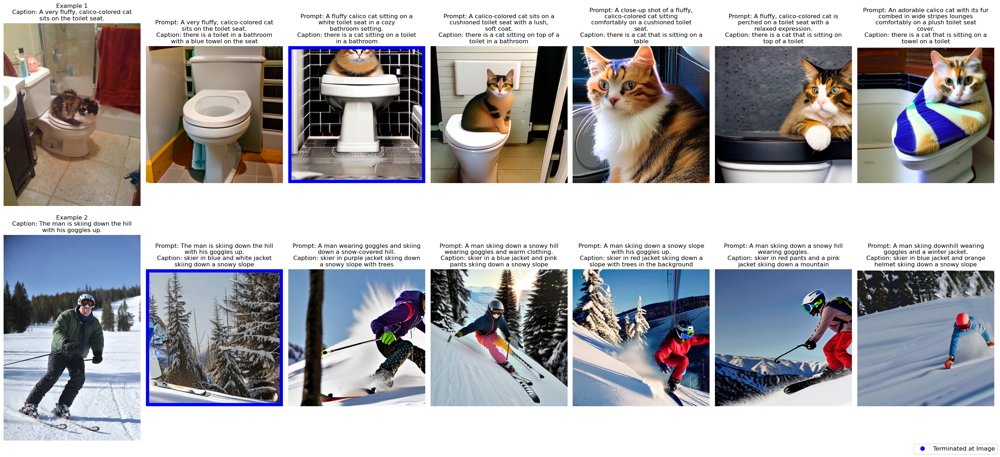

In [6]:
fig, axs = plt.subplots(2, 7, figsize=(28, 13))

row = 0

for dir in dir_list:
    dir_path = os.path.join(experiment_dir, dir)
    if os.path.isdir(dir_path):
        file_list = os.listdir(dir_path)
        image_paths = [os.path.join(dir_path, file) for file in file_list if file.lower().endswith(('.png', '.jpg', '.jpeg'))]
        image_paths = sorted(image_paths)
        image_paths = [image_paths[-1]] + image_paths[:-1]  # make the original image be the first one

        captions_path = os.path.join(dir_path, "captions.csv")
        prompts_path = os.path.join(dir_path, "prompts.csv")
        results_path = os.path.join(dir_path, "results.txt")

        captions = get_lines(captions_path)
        prompts = get_lines(prompts_path)

        terminated_idx = get_highlights(results_path)

        for i, path in enumerate(image_paths):
            image = plt.imread(path)

            axs[row, i].imshow(image)
            axs[row, i].axis('off')

            if i == 0:
                wrapped_prompt = textwrap.fill(prompts[i], 35)
                merged_titles = 'Example ' + str(row+1) + "\n" + 'Caption: ' + wrapped_prompt
            else:
                wrapped_prompt = textwrap.fill(prompts[i-1], 35)
                wrapped_caption = textwrap.fill(captions[i-1], 35)
                merged_titles = 'Prompt: ' + wrapped_prompt + '\n' + 'Caption: ' + wrapped_caption

            axs[row, i].set_title(merged_titles)

            if i == int(terminated_idx) + 1:
                rectangle = plt.Rectangle((0, 0), image.shape[1], image.shape[0], linewidth=13, edgecolor='blue', facecolor='none')
                axs[row, i].add_patch(rectangle)

        row += 1

legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Terminated at Image',
        markerfacecolor='blue', markersize=10)
]
fig.legend(handles=legend_elements, loc='lower right', fontsize='large')

plt.tight_layout()
plt.show()


In [7]:
dir_list = ['000169']

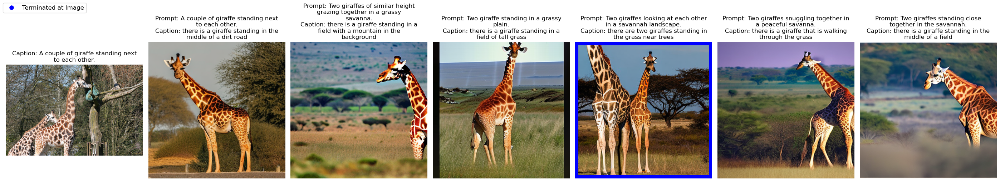

In [8]:
fig, axs = plt.subplots(1, 7, figsize=(28,5))

for dir in dir_list:
    dir_path = os.path.join(experiment_dir, dir)
    if os.path.isdir(dir_path):
        file_list = os.listdir(dir_path)
        image_paths = [os.path.join(dir_path, file) for file in file_list if file.lower().endswith(('.png', '.jpg', '.jpeg'))]
        image_paths = sorted(image_paths)
        image_paths = [image_paths[-1]] + image_paths[:-1]  # make the original image be the first one

        captions_path = os.path.join(dir_path, "captions.csv")
        prompts_path = os.path.join(dir_path, "prompts.csv")
        results_path = os.path.join(dir_path, "results.txt")

        captions = get_lines(captions_path)
        prompts = get_lines(prompts_path)

        terminated_idx = get_highlights(results_path)

        for i, path in enumerate(image_paths):
            image = plt.imread(path)

            axs[i].imshow(image)
            axs[i].axis('off')

            if i == 0:
                wrapped_prompt = textwrap.fill(prompts[i], 35)
                merged_titles = 'Caption: ' + wrapped_prompt
            else:
                wrapped_prompt = textwrap.fill(prompts[i-1], 35)
                wrapped_caption = textwrap.fill(captions[i-1], 35)
                merged_titles = 'Prompt: ' + wrapped_prompt + '\n' + 'Caption: ' + wrapped_caption

            axs[i].set_title(merged_titles)

            if i == int(terminated_idx) + 1:
                rectangle = plt.Rectangle((0, 0), image.shape[1], image.shape[0], linewidth=13, edgecolor='blue', facecolor='none')
                axs[i].add_patch(rectangle)

legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Terminated at Image',
        markerfacecolor='blue', markersize=10)
]
fig.legend(handles=legend_elements, loc='upper left', fontsize='large')

plt.tight_layout()
plt.show()


In [9]:
experiment_dir = '../data/results/full_experiment_V2_parti'

In [10]:
dir_list = ['000015', '000016']

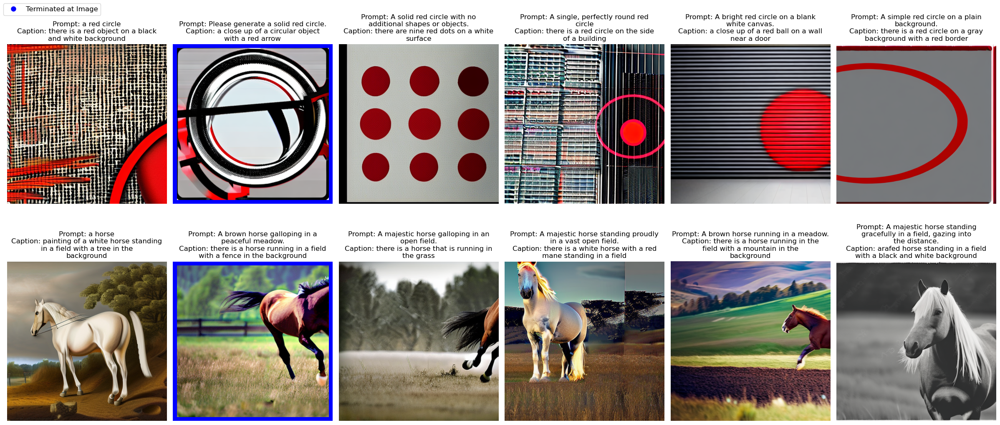

In [11]:
fig, axs = plt.subplots(2, 6, figsize=(24, 11))

row = 0

for dir in dir_list:
    dir_path = os.path.join(experiment_dir, dir)
    if os.path.isdir(dir_path):
        file_list = os.listdir(dir_path)
        image_paths = [os.path.join(dir_path, file) for file in file_list if file.lower().endswith(('.png', '.jpg', '.jpeg'))]
        image_paths = sorted(image_paths)

        captions_path = os.path.join(dir_path, "captions.csv")
        prompts_path = os.path.join(dir_path, "prompts.csv")
        results_path = os.path.join(dir_path, "results.txt")

        captions = get_lines(captions_path)
        prompts = get_lines(prompts_path)

        terminated_idx = get_highlights(results_path)

        for i, path in enumerate(image_paths):
            image = plt.imread(path)

            axs[row, i].imshow(image)
            axs[row, i].axis('off')

            wrapped_prompt = textwrap.fill(prompts[i], 35)
            wrapped_caption = textwrap.fill(captions[i], 35)
            merged_titles = 'Prompt: ' + wrapped_prompt + '\n' + 'Caption: ' + wrapped_caption

            axs[row, i].set_title(merged_titles)

            if i == int(terminated_idx) + 1:
                rectangle = plt.Rectangle((0, 0), image.shape[1], image.shape[0], linewidth=13, edgecolor='blue', facecolor='none')
                axs[row, i].add_patch(rectangle)

        row += 1


legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Terminated at Image',
        markerfacecolor='blue', markersize=10)
]
fig.legend(handles=legend_elements, loc='upper left', fontsize='large')

plt.tight_layout()
plt.show()